In [1]:
import numpy as np
import cv2
import glob
import os 
import matplotlib.pyplot as plt 

IMAGES\0.jpg  read successfully


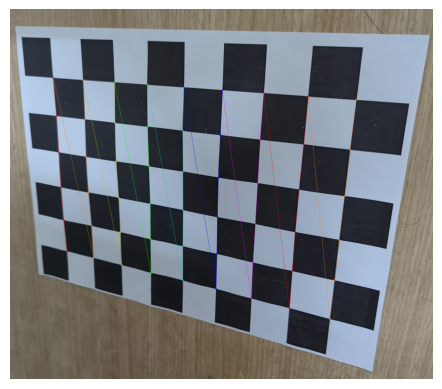

IMAGES\1.jpg  read successfully


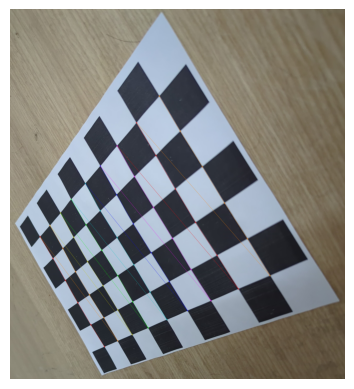

IMAGES\10.jpg  read successfully


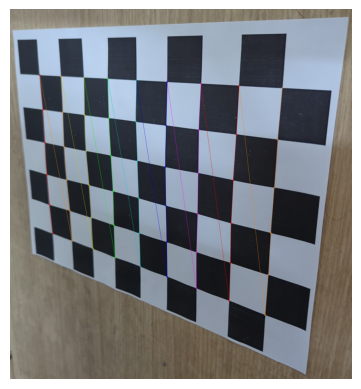

IMAGES\13.jpg  read successfully


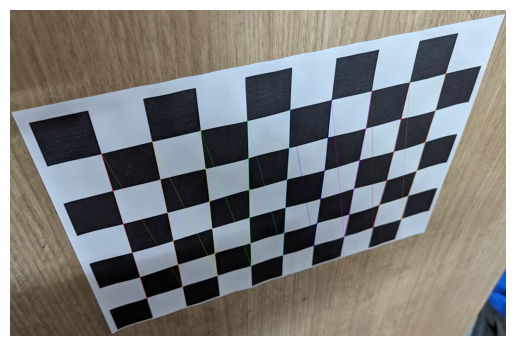

IMAGES\14.jpg  read successfully


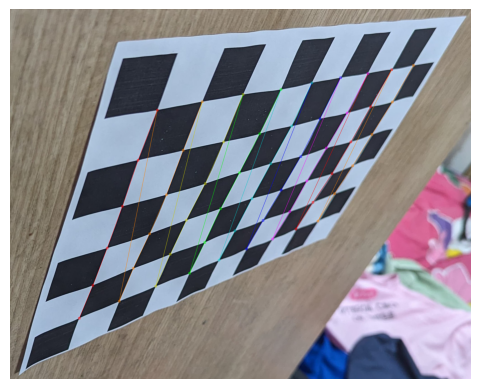

IMAGES\15.jpg  read successfully


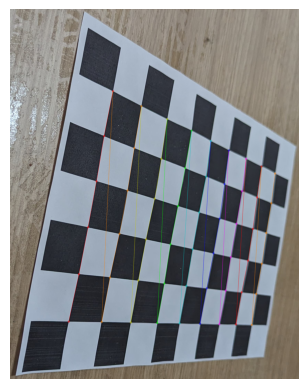

IMAGES\16.jpg  read successfully


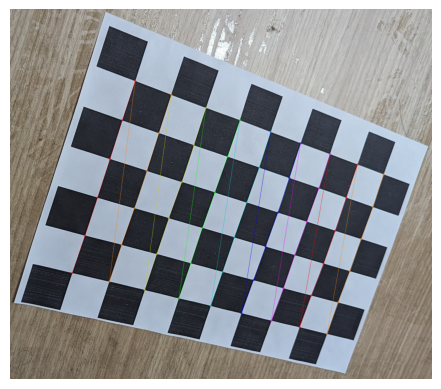

IMAGES\17.jpg  read successfully


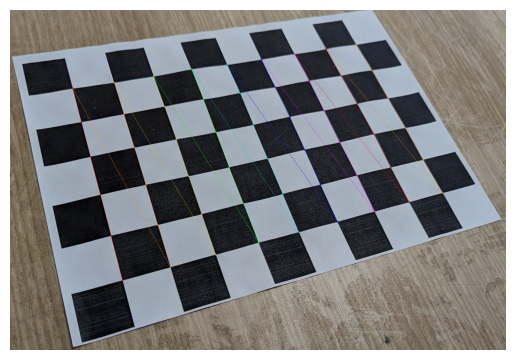

IMAGES\18.jpg  read successfully


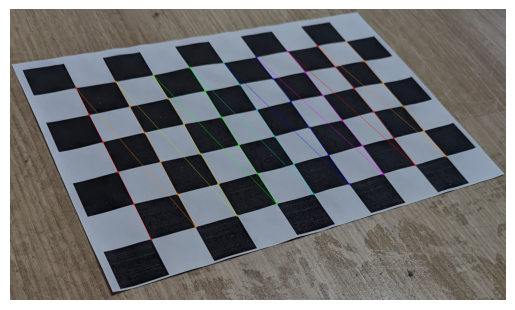

IMAGES\19.jpg  read successfully


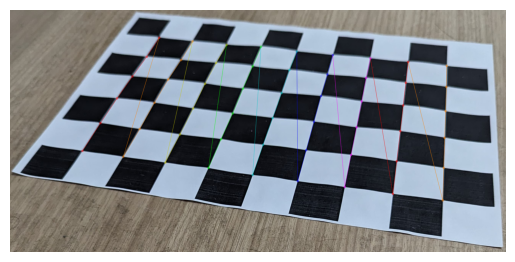

IMAGES\2.jpg  read successfully


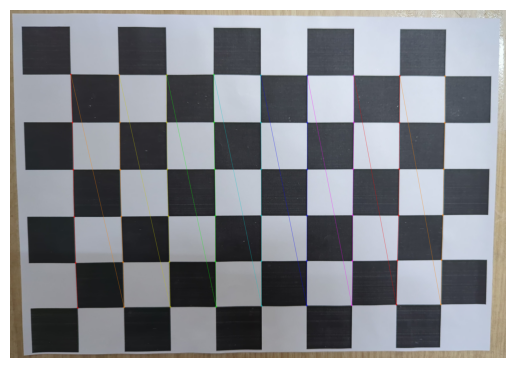

IMAGES\22.jpg  read successfully


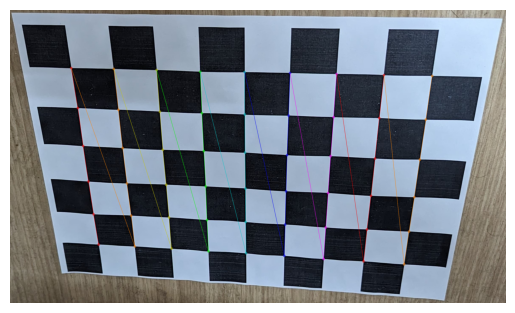

IMAGES\23.jpg  read successfully


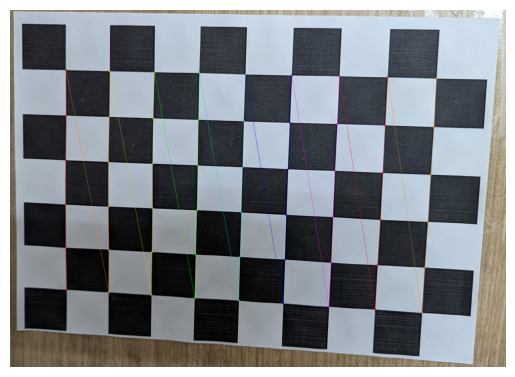

IMAGES\24.jpg  read successfully


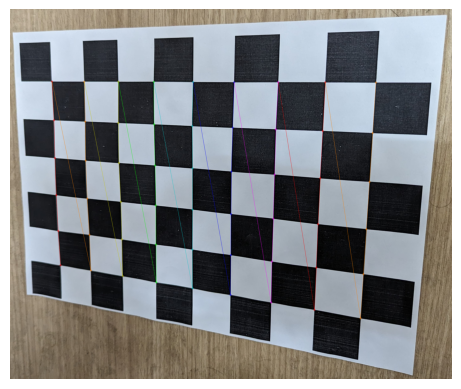

IMAGES\3.jpg  read successfully


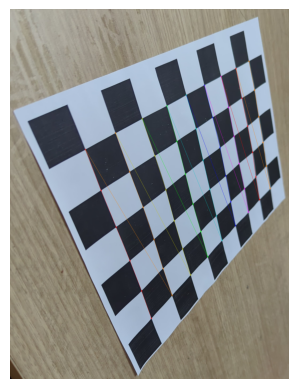

IMAGES\4.jpg  read successfully


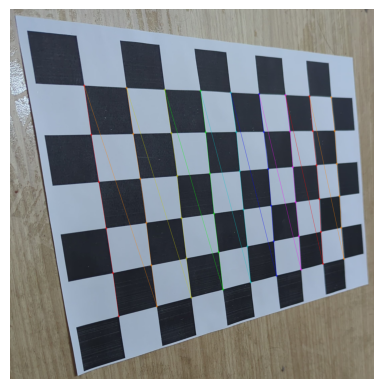

IMAGES\5.jpg  read successfully


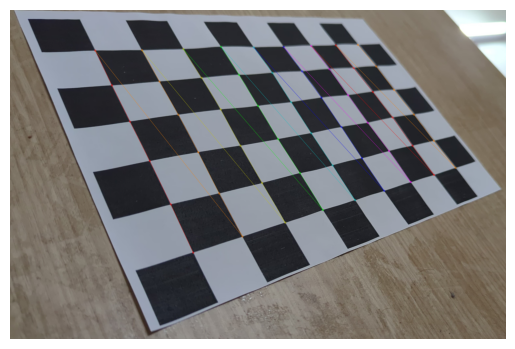

IMAGES\6.jpg  read successfully


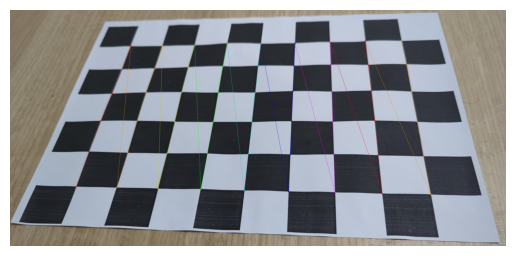

IMAGES\7.jpg  read successfully


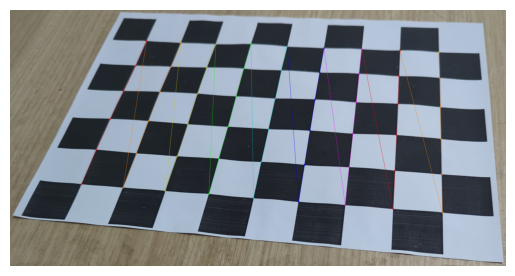

IMAGES\9.jpg  read successfully


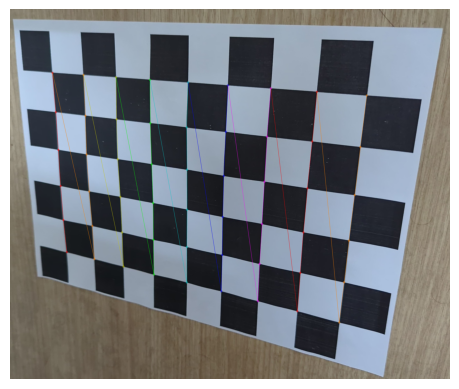

In [2]:
## Code Reference https://learnopencv.com/camera-calibration-using-opencv/
## and CV Assignment 2

CHECKERBOARD = (6,9)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

objpoints = []
imgpoints = [] 
img_path = []
 
objp = np.zeros((1, 6*9, 3), np.float32)
objp[0,:,:2] = np.mgrid[0:CHECKERBOARD[0], 0:CHECKERBOARD[1]].T.reshape(-1, 2)
images = glob.glob('IMAGES//*.jpg')
images = sorted(images)

for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_FAST_CHECK + cv2.CALIB_CB_NORMALIZE_IMAGE)

    if ret == True:
        objpoints.append(objp)
        corners2 = cv2.cornerSubPix(gray, corners, (11,11),(-1,-1), criteria)
        imgpoints.append(corners2)
        print(fname," read successfully")
        img_path.append(fname)
        img = cv2.drawChessboardCorners(img, CHECKERBOARD, corners2, ret)
        image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(image_rgb)
        plt.axis('off')
        plt.show()
 
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [3]:
print(mtx)

[[3.13308593e+03 0.00000000e+00 1.34282433e+03]
 [0.00000000e+00 3.10222097e+03 1.25334178e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [4]:
print(ret)

9.32535288271901


The camera matrix indicates that the focal lengths along the x and y axes are approximately 3133.08593 and 3102.22097 pixels respectively, and the principal point is approximately at coordinates (1342.82433, 1253.34178) pixels. Skew is 0

In [5]:
print(np.array(rvecs).reshape(20,1,3))

[[[-0.0951778   0.58356731 -1.42141169]]

 [[-0.65022033  0.55595317 -2.11738768]]

 [[-0.2714101   0.692981   -1.38483726]]

 [[ 0.80175483  0.40464169 -1.66259952]]

 [[ 1.43913186 -0.06734299 -1.23441408]]

 [[ 0.80969912 -0.7865069  -1.22363344]]

 [[ 0.51472311 -0.23968072 -1.23121922]]

 [[-0.16925673 -0.53236542 -1.82996395]]

 [[-0.17877788 -0.74726183 -1.93201377]]

 [[-0.61516691 -0.43490703 -1.29435066]]

 [[-0.01575818  0.04600677 -1.57304141]]

 [[ 0.48763616  0.55551808 -1.46400596]]

 [[ 0.00610365  0.17714262 -1.52466595]]

 [[-0.13864973  0.45924728 -1.48625002]]

 [[ 0.94745117 -0.56227106 -1.83417915]]

 [[ 0.5808638  -0.54750243 -1.61897093]]

 [[-0.03764808 -0.80780078 -1.85983667]]

 [[-0.62347319 -0.27032992 -1.41286586]]

 [[-0.58100223 -0.27951582 -1.36345728]]

 [[-0.08187267  0.588473   -1.41688074]]]


The above matrix has 20 rows correspoding to the rotation vector of the 20 images selected for camera calibration. 

In [6]:
print(np.array(tvecs).reshape(20,1,3))

[[[-4.95410909  1.00274972 15.25183188]]

 [[-2.43303027  7.08079516 12.80046181]]

 [[-5.42607573  0.94895475 15.54465988]]

 [[-1.70452982  2.78962763 12.57217764]]

 [[-4.53911835  0.51371398 13.56884604]]

 [[-3.54205968  2.03048095 10.83792387]]

 [[-4.94192391  0.52502512 14.87001812]]

 [[-2.16289036  1.32744169 10.33124349]]

 [[-3.1043451  -0.8665866  14.09999677]]

 [[-4.16919678 -2.20545836 13.50346732]]

 [[-2.81384781  2.53223874  9.76003787]]

 [[-5.20863614 -0.77928703 17.59856853]]

 [[-4.17409247  1.40395525 12.66715173]]

 [[-4.41065403  1.6984405  13.43492311]]

 [[-1.01498149  3.93799221 10.84786625]]

 [[-2.57332481  2.17785178 11.19789633]]

 [[-0.5865392   0.58275168  8.98942326]]

 [[-2.71344037  0.11484785 10.31671973]]

 [[-3.48862417 -0.84217713 12.13700207]]

 [[-5.02312552  0.78418865 15.26342697]]]


The above matrix has 20 rows correspoding to the translation vector of the 20 images selected for camera calibration. 

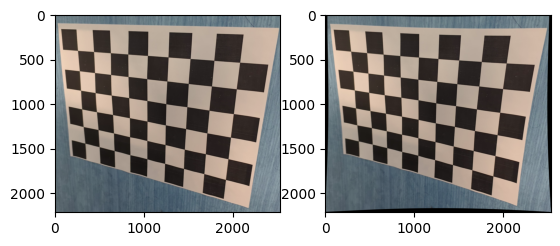

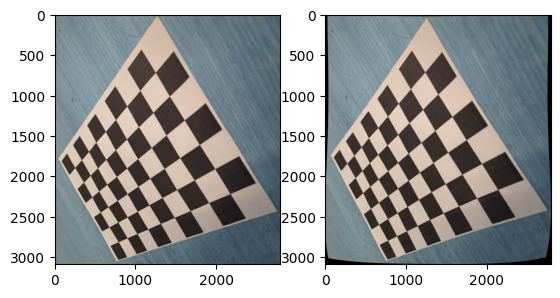

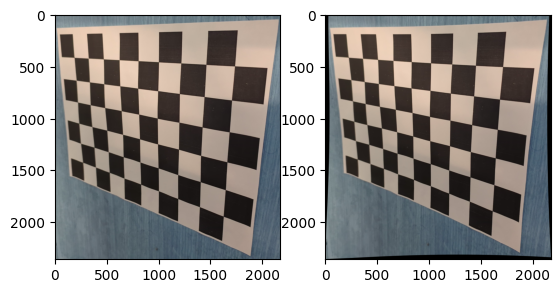

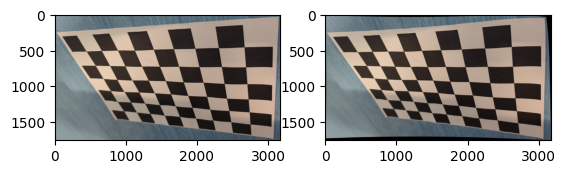

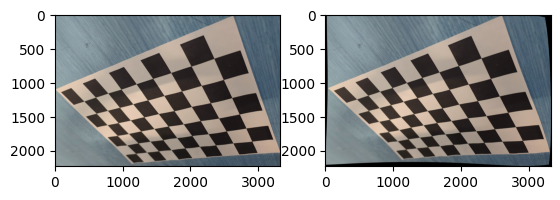

In [7]:
counter = 0
for fname in images:
    counter+=1
    img = cv2.imread(fname)
    height,width = img.shape[:2]
    camMatrixNew,roi = cv2.getOptimalNewCameraMatrix(mtx,dist,(width,height),1,(width,height)) 
    imgUndist = cv2.undistort(img,mtx,dist,None,camMatrixNew)
    fig, axes = plt.subplots(1, 2)
    axes[0].imshow(img)
    axes[1].imshow(imgUndist)
    plt.show()
    if(counter==5):
        break

When we correct for radial distortion, we are essentially applying an inverse transformation to the image to counteract the distortion introduced by the lens. This process involves re-mapping pixels in the image based on the distortion coefficients. Camera calibration aims to model the distortion accurately, but it may not be perfect. Small errors or inaccuracies in the calibration process can lead to discrepancies in the undistorted image, causing straight lines to appear slightly different from the original scene.

In [8]:
err_list = []
reprojected_list = []
for i, path in enumerate(img_path):
    reprojected_points, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    reprojected_list.append(reprojected_points)
    error = cv2.norm(imgpoints[i],  reprojected_points, cv2.NORM_L2)/len(reprojected_points)
    err_list.append(error)
    print(f"Re-projection error for {path}: {error}")  

mean_value = np.mean(err_list)
std_deviation = np.std(err_list)
print("Mean Value: ", mean_value)
print("Std Deviation: ", std_deviation)

Re-projection error for IMAGES\0.jpg: 0.8267441383369012
Re-projection error for IMAGES\1.jpg: 1.7935242072767297
Re-projection error for IMAGES\10.jpg: 0.8673368716951104
Re-projection error for IMAGES\13.jpg: 1.0581408219822153
Re-projection error for IMAGES\14.jpg: 0.7731582069853364
Re-projection error for IMAGES\15.jpg: 1.248827804780745
Re-projection error for IMAGES\16.jpg: 1.4826352090828052
Re-projection error for IMAGES\17.jpg: 0.915031662189506
Re-projection error for IMAGES\18.jpg: 0.5323786924290383
Re-projection error for IMAGES\19.jpg: 0.8097133032434072
Re-projection error for IMAGES\2.jpg: 1.5912632389604928
Re-projection error for IMAGES\22.jpg: 1.5198247091811803
Re-projection error for IMAGES\23.jpg: 1.0790432095237774
Re-projection error for IMAGES\24.jpg: 1.3121055845757115
Re-projection error for IMAGES\3.jpg: 1.3288226822658016
Re-projection error for IMAGES\4.jpg: 1.2071153905885526
Re-projection error for IMAGES\5.jpg: 2.197865944186298
Re-projection error for

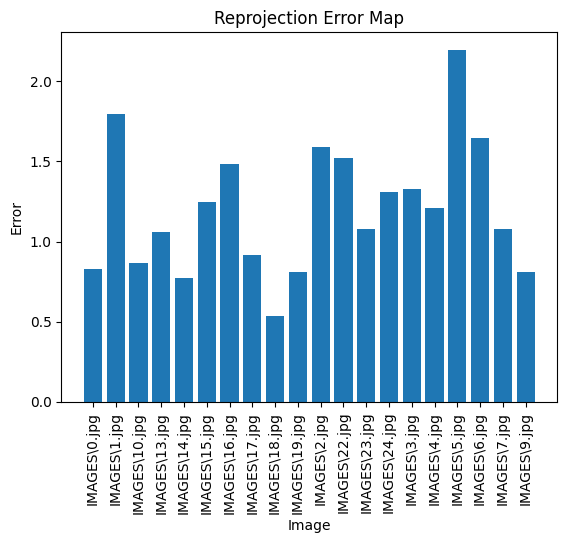

In [9]:
plt.bar(img_path, err_list)
plt.xticks(rotation=90)
plt.xlabel('Image')
plt.ylabel('Error')
plt.title('Reprojection Error Map')
plt.show()

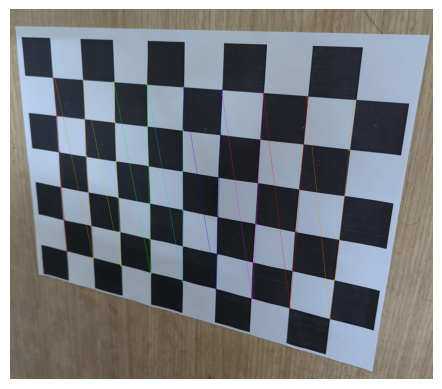

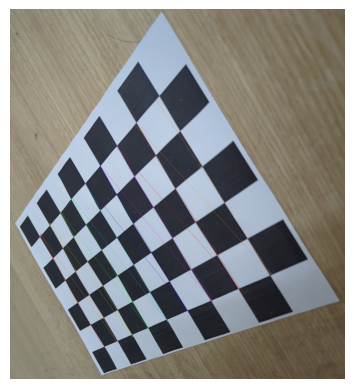

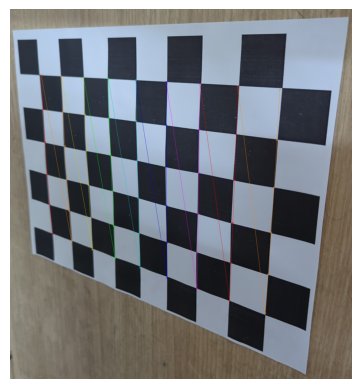

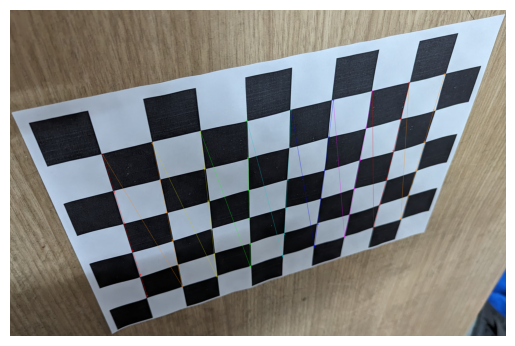

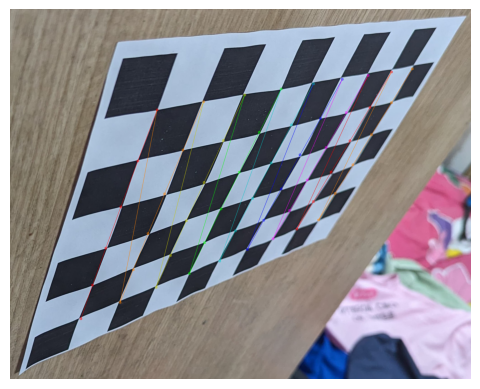

...

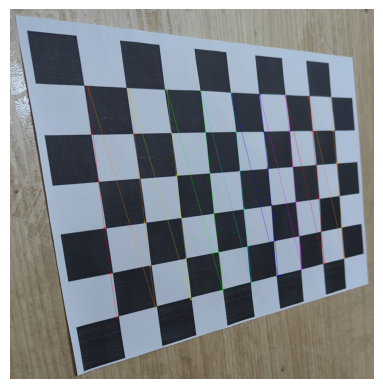

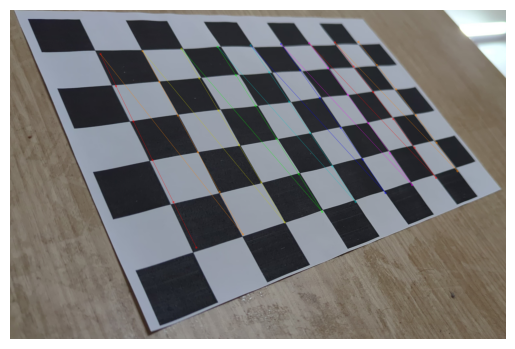

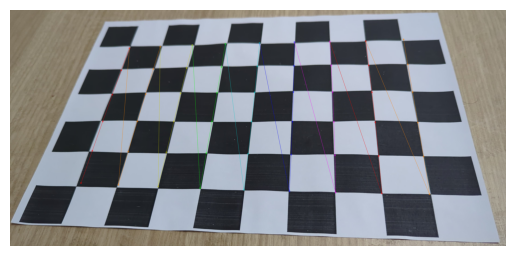

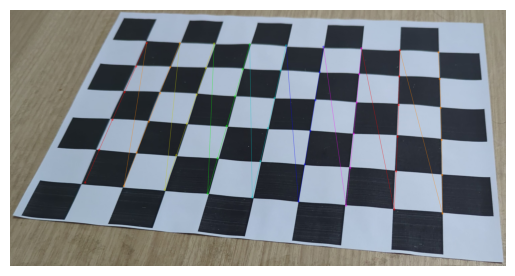

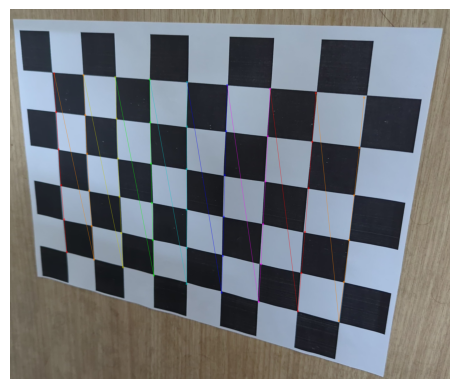

In [10]:
for i, path in enumerate(img_path):
    img = cv2.imread(path)
    img = cv2.drawChessboardCorners(img, CHECKERBOARD, reprojected_list[i], True)
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.show()

Absolute norm is used to calculate the distance between the actual point and projected point.

In [11]:
for i, path in enumerate(img_path):
    R, _ = cv2.Rodrigues(rvecs[i])
    normal_vector = R[:, 2]
    print(f"Plane normal for {path}:", normal_vector)

Plane normal for IMAGES\0.jpg: [ 0.4341759  -0.27724222  0.85710445]
Plane normal for IMAGES\1.jpg: [ 0.62080848 -0.15795509  0.76788477]
Plane normal for IMAGES\10.jpg: [ 0.59305814 -0.21615795  0.77560156]
Plane normal for IMAGES\13.jpg: [-0.28698868 -0.65036842  0.70331957]
Plane normal for IMAGES\14.jpg: [-0.68542616 -0.68799698  0.23843475]
Plane normal for IMAGES\15.jpg: [-0.86139146 -0.10438813  0.49709946]
Plane normal for IMAGES\16.jpg: [-0.44391461 -0.24461113  0.8620355 ]
Plane normal for IMAGES\17.jpg: [-0.14905152  0.43882191  0.88612582]
Plane normal for IMAGES\18.jpg: [-0.19515541  0.57163275  0.79696321]
Plane normal for IMAGES\19.jpg: [0.03943556 0.64229223 0.76544466]
Plane normal for IMAGES\2.jpg: [ 0.03927099 -0.01929383  0.99904231]
Plane normal for IMAGES\22.jpg: [ 0.05413035 -0.61990751  0.78280559]
Plane normal for IMAGES\23.jpg: [ 0.11152483 -0.11449901  0.98714345]
Plane normal for IMAGES\24.jpg: [ 0.37776918 -0.18853726  0.90650105]
Plane normal for IMAGES\3.